<a href="https://colab.research.google.com/github/balalexv/Fruits-and-vegetables/blob/master/NN_Fresh.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.style
import os

matplotlib.style.use('ggplot')

import os, shutil
import cv2
from keras.models import model_from_json

np.set_printoptions(suppress=True)
np.set_printoptions(precision=3)
np.set_printoptions(floatmode = 'fixed')

from progressbar import ProgressBar, Percentage, Bar

Using TensorFlow backend.


In [0]:
bad_files = [
'apple green granny_smith 1 20190917130959 124.png','apple red gala 1 20190917130459 241.png','apple red gala 1 20190917130534 228.png','bananas bananas bananas 0 20190917125309 286.png'
,'bananas bananas bananas 0 20190917125310 119.png','bananas bananas bananas 0 20190917125425 239.png','bananas bananas bananas 0 20190917125426 201.png','bananas bananas bananas 0 20190917125426 519.png'
,'bananas bananas bananas 0 20190917125510 547.png','bananas bananas bananas 0 20190917125511 719.png','bananas bananas bananas 0 20190917125512 374.png'
,'bananas bananas bananas 0 20190917125519 171.png','bananas bananas bananas 1 20190917124824 860.png','bananas bananas bananas 1 20190917125106 287.png','bananas bananas bananas 1 20190917125225 272.png'
,'bananas bananas bananas 1 20190917125539 847.png','cucumbers green prickly 0 20190917165057 145.png','cucumbers green prickly 0 20190917165059 265.png','cucumbers green prickly 0 20190917165104 550.png'
,'cucumbers green prickly 0 20190917165104 862.png','cucumbers green prickly 0 20190917165155 314.png','cucumbers green prickly 0 20190917165155 687.png','cucumbers green prickly 0 20190917165249 938.png'
,'cucumbers green prickly 0 20190917165250 105.png','cucumbers green prickly 0 20190917165250 389.png','cucumbers green prickly 0 20190917165251 992.png','cucumbers green prickly 1 20190917164552 762.png'
,'cucumbers green prickly 1 20190917164605 974.png','cucumbers green prickly 1 20190917164606 109.png','cucumbers green prickly 1 20190917164606 188.png','cucumbers green prickly 1 20190917164714 1.png'
,'cucumbers green prickly 1 20190917164714 29.png','cucumbers green prickly 1 20190917164724 695.png','cucumbers green prickly 1 20190917164725 558.png'
,'cucumbers green prickly 1 20190917164735 93.png','cucumbers green prickly 1 20190917164737 950.png','cucumbers green prickly 1 20190917164738 612.png','cucumbers green prickly 1 20190917164739 233.png'
,'cucumbers green prickly 1 20190917164740 866.png','cucumbers green prickly 1 20190917164740 979.png','cucumbers green prickly 1 20190917164743 734.png','cucumbers green prickly 1 20190917164743 899.png'
,'cucumbers green prickly 1 20190917164744 126.png','cucumbers green prickly 1 20190917164744 419.png','cucumbers green prickly 1 20190917164745 341.png','cucumbers green prickly 1 20190917164745 610.png'
,'cucumbers green prickly 1 20190917164749 71.png','cucumbers green prickly 1 20190917164749 766.png','cucumbers green prickly 1 20190917164750 278.png','cucumbers green prickly 1 20190917164750 689.png'
,'cucumbers green prickly 1 20190917164751 972.png','cucumbers green prickly 1 20190917164757 148.png','cucumbers green prickly 1 20190917164758 119.png','cucumbers green prickly 1 20190917164759 311.png'
,'cucumbers green prickly 1 20190917164800 781.png','cucumbers green prickly 1 20190917164805 849.png','cucumbers green prickly 1 20190917164813 19.png','cucumbers green prickly 1 20190917164822 479.png'
,'cucumbers green prickly 1 20190917164840 536.png','grape green lady_fingers 1 20190914145149 952.png','grape green sultana 1 20190917153933 961.png','grape green sultana 1 20190917153941 96.png'
,'grape green sultana 1 20190917153941 715.png','grape green sultana 1 20190917153942 329.png','grape green sultana 1 20190917153953 442.png','grape green sultana 1 20190917153954 967.png'
,'grape green sultana 1 20190917153958 117.png','grape green sultana 1 20190917154001 295.png','grape green sultana 1 20190917154002 788.png','grape green sultana 1 20190917154003 26.png'
,'grape green sultana 1 20190917154003 179.png','grape green sultana 1 20190917154021 870.png','grape green sultana 1 20190917154022 221.png','grape green sultana 1 20190917154027 459.png'
,'grape green sultana 1 20190917154028 209.png','grape green sultana 1 20190917154028 321.png','grape green sultana 1 20190917154141 368.png','grape green sultana 1 20190917154143 224.png'
,'grape green sultana 1 20190917154144 644.png','grape green sultana 1 20190917154149 843.png','grape green sultana 1 20190917154159 712.png','grape green sultana 1 20190917154200 597.png'
,'grape green sultana 1 20190917154203 828.png','grape green sultana 1 20190917154204 572.png','grape green sultana 1 20190917154207 252.png','grape green sultana 1 20190917154208 884.png'
,'grape green sultana 1 20190917154216 42.png','grape green sultana 1 20190917154217 746.png','grape green sultana 1 20190917154226 80.png','grape green sultana 1 20190917154239 416.png'
,'grape green sultana 1 20190917154250 465.png','grape green sultana 1 20190917154251 791.png','grape green sultana 1 20190917154253 144.png'
,'grape green sultana 1 20190917154254 520.png','grape green sultana 1 20190917154254 610.png','grape green sultana 1 20190917154259 295.png','grape green sultana 1 20190917154300 173.png'
,'lemon yellow lemon_yellow 0 20190917165814 158.png','lemon yellow lemon_yellow 0 20190917165824 694.png','lemon yellow lemon_yellow 0 20190917165834 131.png','lemon yellow lemon_yellow 0 20190917165835 86.png'
,'lemon yellow lemon_yellow 0 20190917165835 535.png','lemon yellow lemon_yellow 0 20190917165837 425.png','lemon yellow lemon_yellow 0 20190917165837 664.png','lemon yellow lemon_yellow 1 20190917165404 876.png'
,'lemon yellow lemon_yellow 1 20190917165411 428.png','lemon yellow lemon_yellow 1 20190917165411 522.png','lemon yellow lemon_yellow 1 20190917165412 982.png','lemon yellow lemon_yellow 1 20190917165413 785.png'
,'lemon yellow lemon_yellow 1 20190917165413 852.png','lemon yellow lemon_yellow 1 20190917165421 903.png','lemon yellow lemon_yellow 1 20190917165422 606.png','lemon yellow lemon_yellow 1 20190917165422 621.png'
,'lemon yellow lemon_yellow 1 20190917165423 567.png','lemon yellow lemon_yellow 1 20190917165427 190.png','lemon yellow lemon_yellow 1 20190917165434 482.png','lemon yellow lemon_yellow 1 20190917165441 210.png'
,'lemon yellow lemon_yellow 1 20190917165441 222.png','lemon yellow lemon_yellow 1 20190917165442 927.png','lemon yellow lemon_yellow 1 20190917165512 433.png','lemon yellow lemon_yellow 1 20190917165515 888.png'
,'lemon yellow lemon_yellow 1 20190917165516 747.png','lemon yellow lemon_yellow 1 20190917165517 397.png','lemon yellow lemon_yellow 1 20190917165517 863.png','lemon yellow lemon_yellow 1 20190917165519 877.png'
,'lemon yellow lemon_yellow 1 20190917165555 371.png','lemon yellow lemon_yellow 1 20190917165555 408.png','lemon yellow lemon_yellow 1 20190917165556 339.png','lemon yellow lemon_yellow 1 20190917165556 478.png'
,'lemon yellow lemon_yellow 1 20190917165557 157.png','lemon yellow lemon_yellow 1 20190917165557 160.png','lemon yellow lemon_yellow 1 20190917165608 43.png','lemon yellow lemon_yellow 1 20190917165608 275.png'
,'lemon yellow lemon_yellow 1 20190917165611 700.png','lemon yellow lemon_yellow 1 20190917165645 615.png','lemon yellow lemon_yellow 1 20190917165645 661.png','lemon yellow lemon_yellow 1 20190917165644 558.png'
,'lemon yellow lemon_yellow 1 20190917165646 680.png','lemon yellow lemon_yellow 1 20190917165703 881.png','lemon yellow lemon_yellow 1 20190917165704 105.png','lemon yellow lemon_yellow 1 20190917165704 509.png'
,'lemon yellow lemon_yellow 1 20190917165737 713.png','lemon yellow lemon_yellow 1 20190917165746 441.png','lemon yellow lemon_yellow 1 20190917165753 247.png','lemon yellow lemon_yellow 1 20190917165758 648.png'
,'lemon yellow lemon_yellow 1 20190917165759 310.png','lemon yellow lemon_yellow 1 20190917165759 789.png','tomato red plum 1 20190917154326 70.png','tomato red plum 1 20190917154326 683.png'
,'tomato red plum 1 20190917154441 415.png','tomato red plum 1 20190917154441 708.png'
]

In [0]:
SIZE_IMG = (128, 128)
SHARE_VAL = 0.2
SHARE_TEST = 0.0

DIR_PHOTOS      = '/content/gdrive/My Drive/datasets/fruits_all/'
DIR_PHOTOS_TEST = '/content/gdrive/My Drive/datasets/test photos'
DIR_MODEL       = '/content/gdrive/My Drive/models/Resnet50 test embedded/'

CL_NAME = 'Art'

EPOCHS = 300

In [6]:
gr0s = []
gr1s = []
arts = []
bags = []
datetimes = []
file_names = []

images = []

i = 0
n = len(os.listdir(DIR_PHOTOS))

pbar = ProgressBar(widgets=[Percentage(), Bar()], maxval=n).start()

for file_name in sorted(os.listdir(DIR_PHOTOS)):
    if (i % 1 == 0) and not (file_name in bad_files):
        if not 'pepper_yellow' in file_name:
            images.append(np.array(Image.open(os.path.join(DIR_PHOTOS,file_name)).resize(SIZE_IMG)))
            split_name = file_name.split()
            gr0s.append(split_name[0])
            gr1s.append(split_name[1])
            arts.append(split_name[2])
            bags.append(split_name[3])
            datetimes.append(split_name[4])
            file_names.append(file_name)
        i += 1   
        pbar.update( i)     
pbar.finish()

images = np.array(images) / 255
df = pd.DataFrame({'Gr0': gr0s, 'Gr1': gr1s, 'Art':arts, 'Bag':bags, 'Datetime':datetimes, 'FileName': file_names})

100%|#########################################################################|


In [0]:
df['cl'] = df[CL_NAME]
df['type'] = [('TEST' if x > (1 - SHARE_TEST) else 'VAL' if x > (1 - SHARE_TEST - SHARE_VAL) else 'TRAIN') for x in np.random.rand(df.shape[0])]
y = pd.get_dummies(df['cl'] )
y_names = df['cl'] 

cnt_cl = np.sum(np.array(y), axis=0)
w_class = np.max(cnt_cl) / cnt_cl

X_train = images[df['type'] == 'TRAIN']
y_train = np.array(y)[df['type'] == 'TRAIN']
y_names_train = np.array(y_names)[df['type'] == 'TRAIN']

X_val = images[df['type'] == 'VAL']
y_val = np.array(y)[df['type'] == 'VAL']
y_names_val = np.array(y_names)[df['type'] == 'VAL']

X_test = images[df['type'] == 'TEST']
y_test = np.array(y)[df['type'] == 'TEST']
y_names_test = np.array(y_names)[df['type'] == 'TEST']

In [8]:
pd.crosstab(df['type'],df['cl'])

cl,bananas,cucumbers_prickly,gala,golden,granny_smith,grape_black,grapefruit_yellow,lady_fingers,lemon_yellow,pepper_red,sultana,tomato_plum
type,,,,,,,,,,,,
TRAIN,503,490,206,187,355,175,152,141,474,105,459,437
VAL,141,121,68,40,84,43,50,38,114,23,90,118


In [9]:
df.groupby(['Gr0', 'Gr1', 'Art','Bag'])['FileName'].count()

Gr0         Gr1      Art                Bag
apple       green    golden             0       86
                                        1      141
                     granny_smith       0       69
                                        1      370
            red      gala               1      274
bananas     bananas  bananas            0      293
                                        1      351
cucumbers   green    cucumbers_prickly  0      225
                                        1      386
grape       black    grape_black        1      218
            green    lady_fingers       1      179
                     sultana            1      549
grapefruit  yellow   grapefruit_yellow  0       91
                                        1      111
lemon       yellow   lemon_yellow       0      147
                                        1      441
pepper      red      pepper_red         0       51
                                        1       77
tomato      red      tomato_plum      

In [0]:
def show_plot(hist):
  plt.plot(hist.history['acc'])
  plt.plot(hist.history['val_acc'])
  plt.title('Model NN')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend(['Train','Val'])
  #plt.xlim([20,30])
  plt.show()

  plt.plot(hist.history['loss'])
  plt.plot(hist.history['val_loss'])
  plt.title('Model NN')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend(['Train','Val'])
  #plt.xlim([20,30])
  plt.show()

  plt.plot(hist.history['loss'])
  plt.plot(hist.history['val_loss'])
  plt.title('Model NN')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend(['Train','Val'])
  plt.ylim([5000,50000])
  plt.show()

In [0]:
def save_model(model, dir = os.getcwd(), name = 'model'):
  model_json = model.to_json()
  with open(os.path.join(dir,name+'.json'), 'w') as json_file:
      json_file.write(model_json)
  model.save_weights(os.path.join(dir,name+'.h5'))
  print("Saved model to disk.")

In [0]:
def load_model(dir = os.getcwd(), name = 'model'):
  json_file = open(os.path.join(dir,name+'.json'), 'r')
  loaded_model_json = json_file.read()
  json_file.close()
  model = model_from_json(loaded_model_json)
  model.load_weights(os.path.join(dir,name+'.h5'))
  print("Loading is complete.")
  return model

In [0]:
def acc_predict(X_imgs, y_true):
    lt = []
    lp = []

    for i in range(X_imgs.shape[0]):
      X_img = X_imgs[i]
      X_img = np.expand_dims(X_img, axis=0)
      pred =  model.predict(X_img)[0]
      lt.append(y.columns[y_true[i] == 1][0])
      lp.append(y.columns[pred == max(pred)][0])

    df_acc_pred = pd.DataFrame({'True': lt, 'Predict':lp})
    return pd.crosstab(df_acc_pred['True'], df_acc_pred['Predict'])

In [0]:
from keras import applications
from keras.models import Model 
from keras.layers import Dropout, Flatten, Dense
from keras import regularizers
from keras import optimizers
from keras import initializers

from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

In [0]:
datagen = ImageDataGenerator(
    rotation_range=90,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=False,
    brightness_range=(0.7, 1),
    rescale=1./255
)

In [19]:
earlyStopping = EarlyStopping(monitor='val_loss', patience=5, verbose=0, mode='min')
mcp_save = ModelCheckpoint(DIR_MODEL + '/model.h5', save_best_only=True, monitor='val_loss', mode='min')
reduce_lr_loss = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1, min_delta=1e-3, mode='min')

base_model = applications.resnet.ResNet50(include_top=False, weights='imagenet', input_tensor=None, input_shape=X_train[0].shape)
#for layer in base_model.layers[:-20]:
#    layer.trainable = False

adam = optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
init = initializers.TruncatedNormal(mean=0.0, stddev=0.05, seed=159)
bias = initializers.Constant(value = 1e-2)

# Add final layers
m = base_model.output
m = Flatten()(m)

m = Dense(512, activation='relu', kernel_regularizer=regularizers.l1(.01), kernel_initializer = init, bias_initializer = bias)(m)
m = Dropout(0.2)(m)

predictions = Dense(len(y_train[0]), activation='softmax', kernel_regularizer=regularizers.l2(.01), kernel_initializer = init, bias_initializer = bias)(m)
model = Model(input=base_model.input, output=predictions)

model.compile(optimizer=adam, loss='categorical_crossentropy', metrics=['accuracy'])

save_model(model, DIR_MODEL, 'model')

hist = model.fit_generator(datagen.flow(X_train, y_train, batch_size = 100), class_weight = w_class, verbose = 1, epochs = EPOCHS, shuffle = True, validation_data=(X_val, y_val), callbacks=[earlyStopping, mcp_save, reduce_lr_loss])
#hist = model.fit(X_train, y_train, class_weight = w_class, verbose = 1, epochs= EPOCHS, validation_data = (X_val, y_val), shuffle = True, batch_size = 100)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("de...)`


Saved model to disk.
Epoch 1/300
37/37 [==============================] - 59s 2s/step - loss: 5796.7191 - acc: 0.4121 - val_loss: 5511.7743 - val_acc: 0.7409
Epoch 2/300
37/37 [==============================] - 38s 1s/step - loss: 5249.9346 - acc: 0.7685 - val_loss: 4977.1634 - val_acc: 0.8602
Epoch 3/300
37/37 [==============================] - 38s 1s/step - loss: 4727.5824 - acc: 0.8533 - val_loss: 4468.7400 - val_acc: 0.9086
Epoch 4/300
37/37 [==============================] - 38s 1s/step - loss: 4233.8955 - acc: 0.8978 - val_loss: 3991.2557 - val_acc: 0.9043
Epoch 5/300
37/37 [==============================] - 37s 1s/step - loss: 3771.5654 - acc: 0.9205 - val_loss: 3545.5085 - val_acc: 0.9269
Epoch 6/300
37/37 [==============================] - 38s 1s/step - loss: 3341.5021 - acc: 0.9223 - val_loss: 3131.9077 - val_acc: 0.9409
Epoch 7/300
37/37 [==============================] - 38s 1s/step - loss: 2943.9626 - acc: 0.9248 - val_loss: 2750.8368 - val_acc: 0.9591
Epoch 8/300
37/37 [=

In [20]:
save_model(model, DIR_MODEL, 'model')

Saved model to disk.


In [0]:
i = np.random.randint(0, len(images))
x = images[i]
#img = Image.fromarray(x)
x = x.reshape((1,) + x.shape)  # this is a Numpy array with shape (1, 3, 150, 150)

fig=plt.figure(figsize=(30, 15))
columns = 8
rows = 5

i = 0
j = 0

for batch in datagen.flow(x, batch_size=1):
    img = Image.fromarray((batch[0] * 255.).astype(np.uint8))
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(img)
    plt.imshow(img)
    i += 1
    if i + 1 > 40:
        break  # otherwise the generator would loop indefinitely
plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.show()


ValueError: ignored

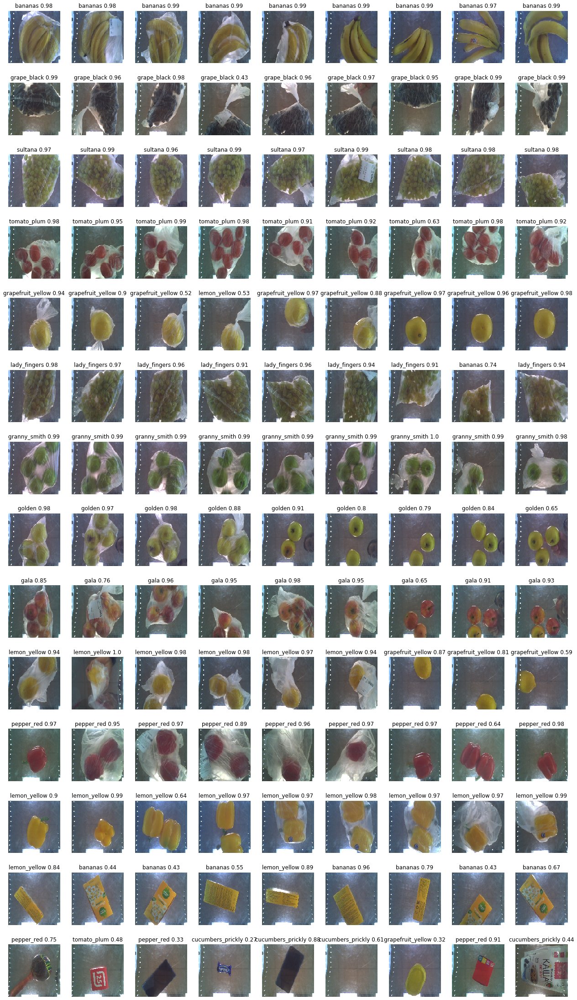

In [21]:
fig=plt.figure(figsize=(22, 44))
columns = 9
rows = 15
i = 0

for file_test in sorted(os.listdir(DIR_PHOTOS_TEST)):
    fig.add_subplot(rows, columns, i + 1)
    img_test = np.array(Image.open(DIR_PHOTOS_TEST+'/'+file_test).resize(SIZE_IMG))
    plt.imshow(img_test)
    img_test = img_test.reshape((1,) + img_test.shape) / 255
    p =  model.predict(img_test)[0]
    title = '{} {:.2}'.format(y.columns[p == max(p)][0], max(p))
    plt.title(title, fontsize=12)
    plt.gca().axes.get_yaxis().set_visible(False)
    plt.gca().axes.get_xaxis().set_visible(False)
    i+=1
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

In [0]:
model = load_model(DIR_MODEL, 'model')
model_new = Model(inputs = model.input, outputs = model.layers[-3].output)
embedded = model_new.predict(X_train)
res = pd.DataFrame(y_names_train, columns = ['class_name']).join(pd.DataFrame(embedded))
centers = res.groupby(['class_name'])[res.columns[1:]].mean()








Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Loading is complete.


In [0]:
centers.to_excel('/content/gdrive/My Drive/temp/2.xlsx')

In [71]:
centers.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511
class_name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
bananas,2.380860,0.036747,0.035486,0.045975,0.014038,0.025249,0.102422,0.017212,2.746496,0.029563,0.036796,0.041693,0.087431,0.027490,0.018630,0.036413,2.175059,0.918710,0.034096,0.026578,1.072952,0.013100,0.064046,0.022579,0.015647,0.025852,0.153015,1.228186,0.037868,0.019917,0.765820,0.747758,0.035443,0.014307,0.028823,0.051393,0.026031,0.044415,0.029773,0.023291,...,0.020768,0.015866,0.020187,0.030895,0.008702,0.023316,0.733608,0.00129,4.012304,0.026686,0.036014,0.038078,0.033753,0.022085,0.022518,0.034508,0.016225,0.034404,0.038854,0.018722,0.056251,0.026587,0.037489,0.020584,0.035235,0.031595,0.007394,0.033766,0.033945,0.034265,0.049852,0.021477,0.051722,1.650698,0.028629,0.054811,0.028289,0.049344,0.030452,0.017559
cucumbers_prickly,0.058477,0.031493,0.033705,0.059367,0.013989,0.025121,0.023651,0.028541,0.018277,0.047616,0.602804,0.744664,0.053383,0.027589,0.058028,0.036346,0.055006,0.049569,0.036741,0.027160,0.356690,0.012811,2.431439,0.022579,0.015650,1.914228,0.079164,0.046466,1.646409,0.430293,0.127661,0.048774,0.035443,0.076851,0.028834,3.753277,0.162958,0.040173,0.029598,0.011596,...,0.103315,0.264775,0.020187,0.014067,0.008701,0.024822,1.699210,0.00129,0.266497,0.021407,0.036027,0.037863,0.015859,0.022075,0.022412,0.034506,0.017910,1.432894,0.167786,0.018722,0.020058,0.428383,0.756825,0.021180,0.035235,0.031499,0.007394,0.033766,0.033937,0.089018,1.760486,0.021477,0.026793,0.044122,0.028279,0.026924,0.024755,1.934715,0.035701,0.019561
gala,0.200430,0.039257,1.414168,4.063284,0.013991,0.025286,0.026179,0.002354,0.335010,0.031994,0.037032,0.041351,0.731659,0.027568,0.003726,0.036433,0.755151,0.014178,1.071732,0.027360,0.018942,0.012791,1.127546,0.022579,0.015661,0.022707,0.248571,0.048536,0.023907,0.018491,0.038306,0.361225,0.035443,0.032594,0.027815,0.446024,0.038679,0.040369,0.028954,0.023286,...,0.205234,0.220726,0.020187,0.040915,0.008705,0.037039,0.041555,0.00129,0.106791,0.756504,0.036010,0.036317,0.189537,0.022085,0.022381,0.034509,0.050127,0.022107,0.137389,0.018722,1.016692,0.023054,0.046543,0.021304,0.035235,0.031581,0.007394,0.033766,0.033945,0.034075,0.032691,0.021477,0.030873,1.145630,0.028725,0.679452,0.137477,0.332469,0.077764,0.004723
golden,0.165234,0.490773,0.040491,0.052631,0.014216,0.025253,0.057228,0.080502,0.564413,1.486008,0.035636,0.040061,0.052081,0.027170,0.035575,0.036420,2.608478,0.036324,0.033941,0.027246,0.634931,0.112162,0.086553,0.022579,0.015654,0.032765,1.408969,0.033596,0.028442,0.023172,0.055948,0.196469,0.035443,0.431394,0.028028,0.257965,0.076332,0.057521,0.029592,0.023315,...,0.061744,0.120513,0.020187,0.028589,0.008749,0.022195,0.052861,0.00129,0.228608,0.025216,0.035624,0.038163,3.132487,0.022085,0.022431,0.034507,0.014963,0.038068,0.032528,0.018722,0.373240,0.027640,0.033661,0.017982,0.035235,0.031536,0.007394,0.033766,0.031360,0.094180,0.093490,0.021477,0.031319,0.031488,0.028685,6.491360,0.379937,0.175866,0.027939,0.029084
granny_smith,0.044257,0.030364,0.049727,0.379507,0.014367,0.025233,1.061759,0.026323,0.727121,0.040560,0.054047,0.061479,0.040755,0.009937,0.028918,0.036421,1.760710,0.033236,0.178361,0.027338,0.057071,0.059622,0.130927,0.022579,0.015647,0.153832,0.025221,0.060150,0.031223,0.022235,0.038931,2.039180,0.035443,0.011649,0.028796,0.270347,0.768494,0.761153,0.029512,0.022934,...,0.307205,0.016043,0.020187,0.028643,0.008702,0.006298,0.049399,0.00129,0.056202,0.063264,0.035977,0.038292,0.865110,0.022085,0.021837,0.034508,0.015094,0.034863,0.038216,0.018722,0.053082,0.026719,0.076480,0.015772,0.035235,0.031599,0.007394,0.033766,0.033923,0.004305,0.074729,0.021477,0.118760,0.020971,0.028653,0.249009,0.0

In [0]:
from scipy.spatial.distance import cosine

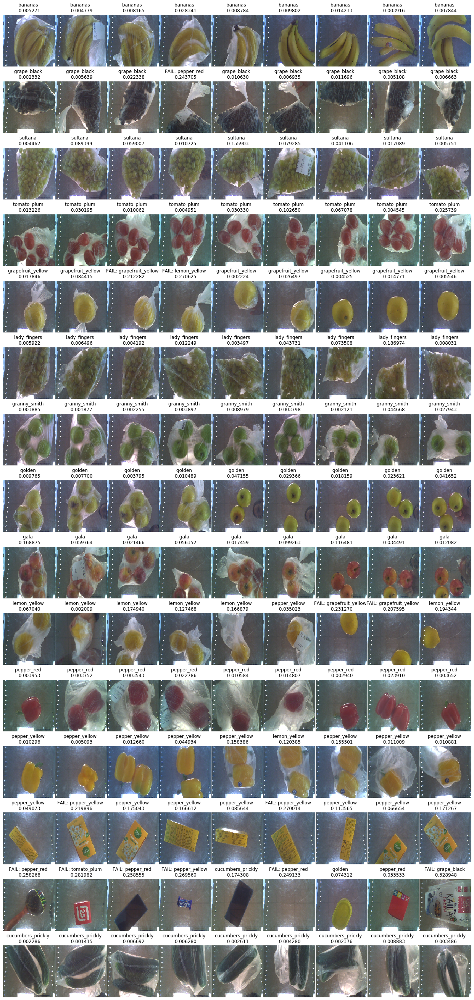

In [92]:
fig=plt.figure(figsize=(22, 48))
columns = 9
rows = 15
i = 0

for file_test in sorted(os.listdir(DIR_PHOTOS_TEST)):

    fig.add_subplot(rows, columns, i + 1)
    img_test = np.array(Image.open(DIR_PHOTOS_TEST+'/'+file_test).resize(SIZE_IMG))
    plt.imshow(img_test)
    img_test = img_test.reshape((1,) + img_test.shape) / 255
    p =  model_new.predict(img_test)[0]

    min_distance = 99999999.
    best_item    = 'None'
    
    for index, row in centers.iterrows():
        distance = cosine(p, row)
        if distance < min_distance:
            min_distance = distance
            best_item = index

    #print(min_distance)
    #p =  model.predict(img_test)[0]
    #title = best_item
    if min_distance < 0.2:
        title = '{} \n {:1.6f}'.format(best_item, min_distance)
    else:
        title = 'FAIL: {} \n {:1.6f}'.format(best_item, min_distance)
    #title = '{} {:.2}'.format(y.columns[p == max(p)][0], max(p))
    plt.title(title, fontsize=12)
    plt.gca().axes.get_yaxis().set_visible(False)
    plt.gca().axes.get_xaxis().set_visible(False)
    i+=1
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()